In [1]:
# set up the python
import cosima_cookbook as cc
from dask.distributed import Client
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import numpy as np
import xarray as xr
import cmocean as cm
import cartopy.crs as ccrs
import cmocean as cm
import cartopy.feature as cft
import cftime
import IPython.display
import sys, os, warnings
from cartopy.mpl.ticker import (LongitudeFormatter, LatitudeFormatter,
                                LatitudeLocator)
import matplotlib.ticker as mticker

In [2]:
# creat the database
db = 'mom6_hycom1.db'
session = cc.database.create_session(db)

In [3]:
# dic
directory_list=['/g/data/x77/hm1221/mom6_simulations/wind-up-whole', 
                '/g/data/x77/hm1221/mom6_simulations/wind-down-whole',
               '/g/data/ik11/outputs/mom6-panan/panant-01-hycom1-v13',
               ]



In [4]:
# load the data to database
cc.database.build_index(directory_list, session)

Indexing experiment: wind-up-whole


0it [00:00, ?it/s]


Indexing experiment: wind-down-whole


0it [00:00, ?it/s]


Indexing experiment: panant-01-hycom1-v13


0it [00:00, ?it/s]


0

In [5]:
# set the time period
start_time = '1994-01-01'
end_time = '1998-01-01'

In [6]:
# load the perturbation umo
umo_down = cc.querying.getvar('wind-down-whole', 'umo', session).sel(time = slice(start_time,end_time))
umo_up = cc.querying.getvar('wind-up-whole', 'umo', session).sel(time = slice(start_time,end_time))

In [7]:
# laod control umo
session = cc.database.create_session()
umo_con = cc.querying.getvar(expt='panant-01-hycom1-v13', variable='umo', 
                          session=session, frequency='1 monthly',
                          start_time='1991-01-31 00:00:00', 
                          end_time='2000-12-31 00:00:00').sel(time = slice(start_time,end_time))


In [8]:
#select the connection region
#control
flux_con1 = umo_con.sel(xq = slice(-280,-180)).sel(yh = slice(-90,-50))
flux_con2 = umo_con.sel(xq = slice(60,80)).sel(yh = slice(-90,-50))
flux_con = xr.concat([flux_con2,flux_con1],dim='xq')
# up
flux_up1 = umo_up.sel(xq = slice(-280,-180)).sel(yh = slice(-90,-50))
flux_up2 = umo_up.sel(xq = slice(60,80)).sel(yh = slice(-90,-50))
flux_up = xr.concat([flux_up2,flux_up1],dim='xq')
# down
flux_down1 = umo_down.sel(xq = slice(-280,-180)).sel(yh = slice(-90,-50))
flux_down2 = umo_down.sel(xq = slice(60,80)).sel(yh = slice(-90,-50))
flux_down = xr.concat([flux_down2,flux_down1],dim='xq')

In [9]:
# New coordinate
x01 = np.arange(60,180,0.1)

In [10]:
# umo with new coordinates
flux_con = xr.DataArray(flux_con, dims = ['time','rho2_l','yh','xq'], coords = [flux_con.time,flux_con.rho2_l,flux_con.yh, x01])
flux_down = xr.DataArray(flux_down, dims = ['time','rho2_l','yh','xq'], coords = [flux_down.time,flux_down.rho2_l,flux_down.yh, x01])
flux_up = xr.DataArray(flux_up, dims = ['time','rho2_l','yh','xq'], coords = [flux_up.time,flux_up.rho2_l,flux_up.yh, x01])

flux_con# The total zonal flux

In [11]:
flux_con

,Array,Chunk
Bytes,11.29 GiB,2.85 MiB
Shape,"(48, 79, 666, 1200)","(1, 12, 121, 515)"
Count,117976 Tasks,6048 Chunks
Type,float32,numpy.ndarray


In [12]:
# compute the total flux
flux_total_con = (flux_con.mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_total_up = (flux_up.mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_total_down = (flux_down.mean('time').cumsum('yh').sum('rho2_l')/1e9).load()

In [13]:
# get the depth
depth = cc.querying.getvar('panant-01-zstar','deptho',session,n=1)
land_mask = np.squeeze(depth.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)

Text(0, 0.5, 'Streamfunction (sv)')

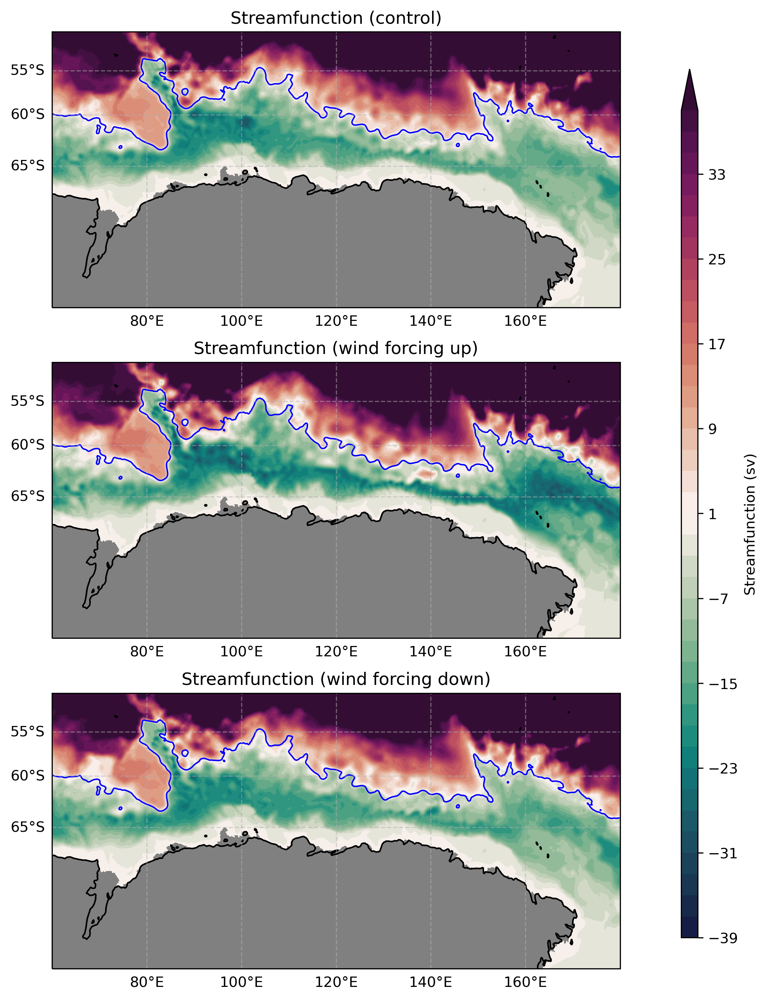

In [14]:
# plot the connection region
# control
projection=ccrs.Mercator(min_latitude=-75.0, max_latitude=-50.0)
fig = plt.figure(figsize=(8, 12), dpi=300)
ax = plt.subplot(3, 1, 1, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_total_con.plot.contourf(ax =ax, levels = np.arange(-39,40,2), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_total_con.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Streamfunction (control)')
ax. grid(False)

# up
ax = plt.subplot(3, 1, 2, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_total_up.plot.contourf(ax =ax, levels = np.arange(-39,40,2), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_total_con.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Streamfunction (wind forcing up)')
ax. grid(False)

# down
ax = plt.subplot(3, 1, 3, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_total_down.plot.contourf(ax =ax, levels = np.arange(-39,40,2), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_total_con.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Streamfunction (wind forcing down)')
ax. grid(False)

# colorbar 
ax = plt.axes([0.93, 0.15, 0.02, 0.7])
cb = plt.colorbar(p1, cax=ax, orientation='vertical',extend = 'neither')
cb.ax.set_ylabel('Streamfunction (sv)')

In [15]:
# calculate the anomalies 
ano_up = (flux_total_up - flux_total_con).load()
ano_down = (flux_total_down - flux_total_con).load()

In [16]:
# filter 0-sv contour inside
ano_up = ano_up.where(flux_total_con < 0.).load()
ano_down = ano_down.where(flux_total_con < 0.).load()

Text(0, 0.5, 'Streamfunction anomaly (sv)')

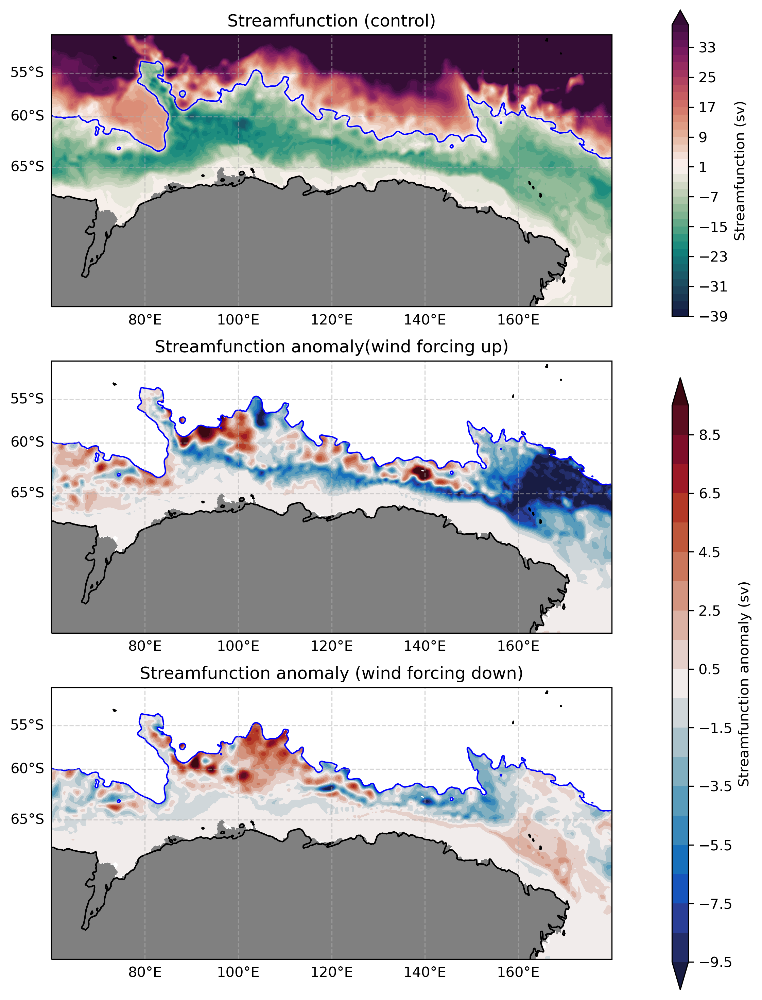

In [17]:
# plot the connection region
# control
projection=ccrs.Mercator(min_latitude=-75.0, max_latitude=-50.0)
fig = plt.figure(figsize=(8, 12), dpi=300)
ax = plt.subplot(3, 1, 1, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_total_con.plot.contourf(ax =ax, levels = np.arange(-39,40,2), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_total_con.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Streamfunction (control)')
ax. grid(False)

# up
ax = plt.subplot(3, 1, 2, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_up.plot.contourf(ax =ax, levels = np.arange(-9.5,10,1), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_total_con.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Streamfunction anomaly(wind forcing up)')
ax. grid(False)

# down
ax = plt.subplot(3, 1, 3, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_down.plot.contourf(ax =ax, levels = np.arange(-9.5,10,1), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_total_con.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Streamfunction anomaly (wind forcing down)')
ax. grid(False)

# colorbar 
ax = plt.axes([0.93, 0.65, 0.02, 0.25])
cb = plt.colorbar(p1, cax=ax, orientation='vertical',extend = 'neither')
cb.ax.set_ylabel('Streamfunction (sv)')

ax = plt.axes([0.93, 0.10, 0.02, 0.5])
cb = plt.colorbar(p2, cax=ax, orientation='vertical',extend = 'neither')
cb.ax.set_ylabel('Streamfunction anomaly (sv)')

# find the saddle point in perturbations

the right saddle point

In [18]:
# find max transport in each lon
flux_total_con_min = flux_total_con.sel(xq = slice(100,160)).min('yh').load()
flux_total_up_min = flux_total_up.sel(xq = slice(100,160)).min('yh').load()
flux_total_down_min = flux_total_down.sel(xq = slice(100,160)).min('yh').load()

In [19]:
flux_total_con

<xarray.DataArray 'umo' (yh: 666, xq: 1200)>
array([[  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       [  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       [  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       ...,
       [ 44.90578 ,  45.49746 ,  46.16473 , ..., 112.07081 , 111.659996,
        111.411415],
       [ 44.901   ,  45.422443,  46.039494, ..., 118.06099 , 117.56152 ,
        117.19405 ],
       [ 45.111797,  45.565605,  46.049107, ..., 124.03366 , 123.42752 ,
        122.94663 ]], dtype=float32)
Coordinates:
  * yh       (yh) float64 -81.11 -81.07 -81.02 -80.98 ... -50.16 -50.09 -50.03
  * xq       (xq) float64 60.0 60.1 60.2 60.3 60.4 ... 179.6 179.7 179.8 179.9

In [20]:
# Calculate the lat of min trans
lon_min_con = flux_total_con_min.values.argmax()+400
lon_min_up = flux_total_up_min.values.argmax()+400
lon_min_down = flux_total_down_min.values.argmax()+400

In [21]:
# calculate the lon of the min trans
lat_min_con = flux_total_con[:,lon_min_con].values.argmin()
lat_min_up = flux_total_up[:,lon_min_up].values.argmin()
lat_min_down = flux_total_down[:,lon_min_down].values.argmin()

In [22]:
saddle_con = flux_total_con[lat_min_con,lon_min_con].values
saddle_up = flux_total_up[lat_min_up,lon_min_up].values
saddle_down = flux_total_down[lat_min_down,lon_min_down].values

In [23]:
saddle_con

array(-14.281066, dtype=float32)

In [24]:
saddle_up

array(-18.330225, dtype=float32)

In [25]:
saddle_down

array(-14.840417, dtype=float32)

Above is the saddle point between the Australian-Antarctic Basin Gyre and Ross Gyre, here we have to compute the saddle point between the Antarctic-Australian Basin Gyre between Weddell Gyre.

In [26]:
flux_total_con_min = flux_total_con.sel(xq = slice(60,100)).min('yh').load()
flux_total_up_min = flux_total_up.sel(xq = slice(60,100)).min('yh').load()
flux_total_down_min = flux_total_down.sel(xq = slice(60,100)).min('yh').load()

In [27]:
# Calculate the lat of min trans
lon_min_con_1 = flux_total_con_min.values.argmax()
lon_min_up_1 = flux_total_up_min.values.argmax()
lon_min_down_1 = flux_total_down_min.values.argmax()

In [28]:
# calculate the lon of the min trans
lat_min_con_1 = flux_total_con[:,lon_min_con_1].values.argmin()
lat_min_up_1 = flux_total_up[:,lon_min_up_1].values.argmin()
lat_min_down_1 = flux_total_down[:,lon_min_down_1].values.argmin()

In [29]:
saddle_con_1 = flux_total_con[lat_min_con_1,lon_min_con_1].values
saddle_up_1 = flux_total_up[lat_min_up_1,lon_min_up_1].values
saddle_down_1 = flux_total_down[lat_min_down_1,lon_min_down_1].values

In [30]:
saddle_con_1

array(-15.098322, dtype=float32)

In [31]:
saddle_up_1

array(-14.792677, dtype=float32)

In [32]:
saddle_down_1

array(-15.74614, dtype=float32)

In [33]:
colormap = np.concatenate((np.arange(-20,0,1),np.arange(0,40,2)),axis=None)

In [34]:
colormap

array([-20, -19, -18, -17, -16, -15, -14, -13, -12, -11, -10,  -9,  -8,
        -7,  -6,  -5,  -4,  -3,  -2,  -1,   0,   2,   4,   6,   8,  10,
        12,  14,  16,  18,  20,  22,  24,  26,  28,  30,  32,  34,  36,
        38])

In [35]:
# set the coordinates
xq = flux_total_con.xq
yh = flux_total_con.yh

In [36]:
# function to make boundary path
# make a path around boundary to create a sector map, then cut it out

def make_boundary_path(lons, lats):
    boundary_path = np.array([lons[-1, :], lats[-1, :]])
    boundary_path = np.append(boundary_path, np.array([lons[::-1, -1], lats[::-1, -1]]), axis=1)
    boundary_path = np.append(boundary_path, np.array([lons[1, ::-1], lats[1, ::-1]]), axis=1)
    boundary_path = np.append(boundary_path, np.array([lons[:, 1], lats[:, 1]]), axis=1)
    boundary_path = mpath.Path(np.swapaxes(boundary_path, 0, 1))
    return boundary_path

In [37]:
flux_total_con


<xarray.DataArray 'umo' (yh: 666, xq: 1200)>
array([[  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       [  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       [  0.      ,   0.      ,   0.      , ...,   0.      ,   0.      ,
          0.      ],
       ...,
       [ 44.90578 ,  45.49746 ,  46.16473 , ..., 112.07081 , 111.659996,
        111.411415],
       [ 44.901   ,  45.422443,  46.039494, ..., 118.06099 , 117.56152 ,
        117.19405 ],
       [ 45.111797,  45.565605,  46.049107, ..., 124.03366 , 123.42752 ,
        122.94663 ]], dtype=float32)
Coordinates:
  * yh       (yh) float64 -81.11 -81.07 -81.02 -80.98 ... -50.16 -50.09 -50.03
  * xq       (xq) float64 60.0 60.1 60.2 60.3 60.4 ... 179.6 179.7 179.8 179.9

In [38]:
# create an 2d array using xq and yh
lons = np.zeros((666,1200))
lats = np.zeros((666,1200))
x = xq.values
y = yh.values
for i in range(666):
    for j in range(1200):
        lons[:,j] = x[j]
        lats[i,:] = y[i]

In [40]:
boundary_path = make_boundary_path(lons, lats)

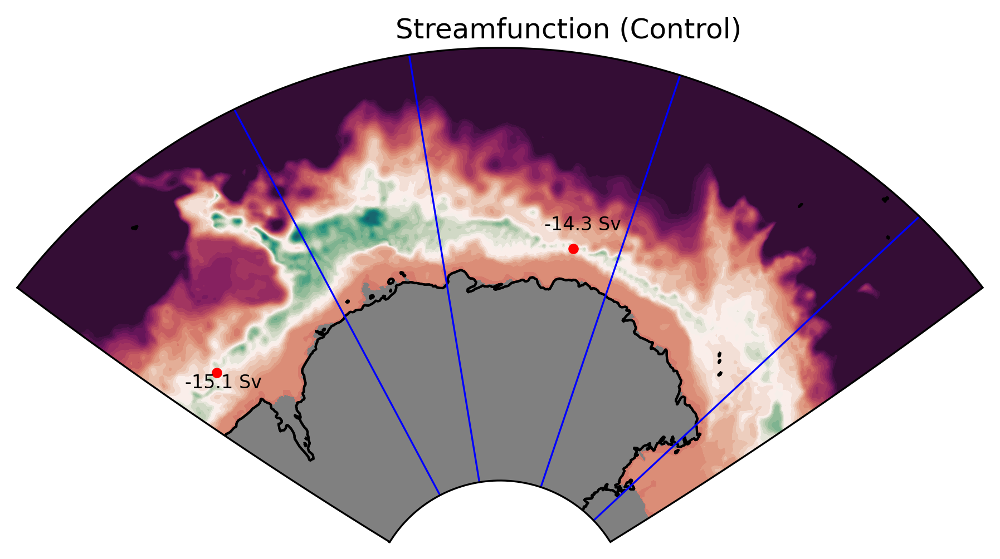

In [41]:
# plot the connection region with the saddle point
# con
projection=ccrs.Stereographic(central_longitude=120, central_latitude=-67.5)
#projection=ccrs.Mercator(min_latitude=-75.0, max_latitude=-50.0)
fig = plt.figure(figsize=(8, 12), dpi=300)
ax = plt.subplot(3, 1, 1, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([-280, -180, -75, -50], crs=ccrs.PlateCarree())
p1 = (flux_total_con+14.281066).plot.contourf(ax =ax, levels = colormap, transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
ax.scatter(xq[lon_min_con],yh[lat_min_con],color = 'r',s=12,transform=ccrs.PlateCarree())
ax.scatter(xq[lon_min_con_1],yh[lat_min_con_1],color = 'r',s=12,transform=ccrs.PlateCarree())
ax.text(xq[lon_min_con]-5,yh[lat_min_con]+1,'-14.3 Sv',fontsize = 8,color = 'k',transform=ccrs.PlateCarree())
ax.text(xq[lon_min_con_1]-5,yh[lat_min_con_1]+1,'-15.1 Sv',fontsize = 8,color = 'k',transform=ccrs.PlateCarree())
ax.plot([90,90],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([110,110],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([140,140],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([170,170],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.set_title('Streamfunction (Control)')
ax. grid(False)

Text(0.5, 0, 'Streamfunction (sv)')

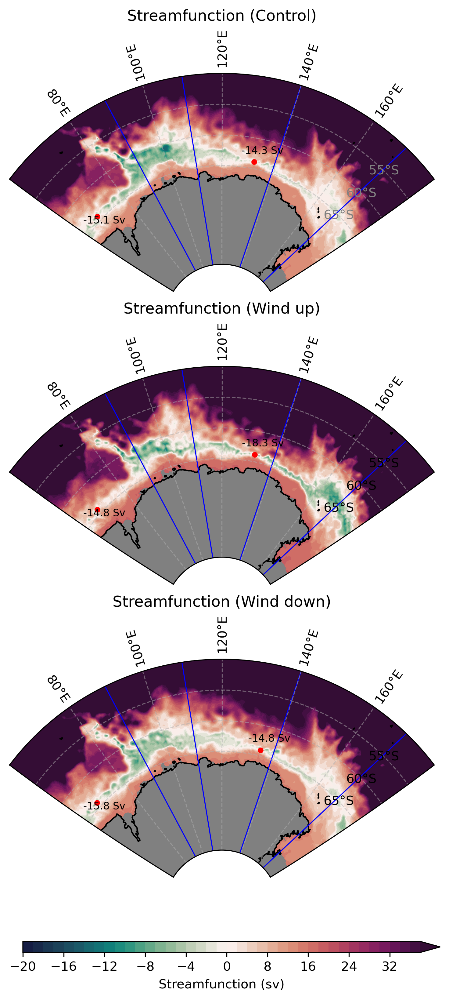

In [42]:
# plot the connection region with the saddle point
# con
projection=ccrs.Stereographic(central_longitude=120, central_latitude=-67.5)
#projection=ccrs.Mercator(min_latitude=-75.0, max_latitude=-50.0)
fig = plt.figure(figsize=(6, 12), dpi=300)
ax = plt.subplot(3, 1, 1, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_bottom = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
lb.ylabel_style = {'color': 'grey'}
p1 = (flux_total_con+14.281066).plot.contourf(ax =ax, levels = colormap, transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
ax.scatter(xq[lon_min_con],yh[lat_min_con],color = 'r',s=12,transform=ccrs.PlateCarree())
ax.scatter(xq[lon_min_con_1],yh[lat_min_con_1],color = 'r',s=12,transform=ccrs.PlateCarree())
ax.text(xq[lon_min_con]-5,yh[lat_min_con]+1,'-14.3 Sv',fontsize = 8,color = 'k',transform=ccrs.PlateCarree())
ax.text(xq[lon_min_con_1]-5,yh[lat_min_con_1]+1,'-15.1 Sv',fontsize = 8,color = 'k',transform=ccrs.PlateCarree())
ax.plot([90,90],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([110,110],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([140,140],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([170,170],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.set_title('Streamfunction (Control)')
ax. grid(False)


# up
ax = plt.subplot(3, 1, 2, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_bottom = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = (flux_total_up+18.330225).plot.contourf(ax =ax, levels = colormap, transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
ax.scatter(xq[lon_min_up],yh[lat_min_up],color = 'r',s=12,transform=ccrs.PlateCarree())
ax.scatter(xq[lon_min_up_1],yh[lat_min_up_1],color = 'r',s=12,transform=ccrs.PlateCarree())
ax.text(xq[lon_min_up]-5,yh[lat_min_up]+1,'-18.3 Sv',fontsize = 8,color = 'k',transform=ccrs.PlateCarree())
ax.text(xq[lon_min_up_1]-5,yh[lat_min_up_1]+1,'-14.8 Sv',fontsize = 8,color = 'k',transform=ccrs.PlateCarree())
ax.plot([90,90],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([110,110],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([140,140],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([170,170],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Streamfunction (Wind up)')
ax. grid(False)

# down
ax = plt.subplot(3, 1, 3, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_bottom = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = (flux_total_down+14.840417).plot.contourf(ax =ax, levels = colormap, transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_boundary(boundary_path, transform=ccrs.PlateCarree())
ax.scatter(xq[lon_min_down],yh[lat_min_down],color = 'r',s=12,transform=ccrs.PlateCarree())
ax.scatter(xq[lon_min_down_1],yh[lat_min_down_1],color = 'r',s=12,transform=ccrs.PlateCarree())
ax.text(xq[lon_min_down]-5,yh[lat_min_down]+1,'-14.8 Sv',fontsize = 8,color = 'k',transform=ccrs.PlateCarree())
ax.text(xq[lon_min_down_1]-5,yh[lat_min_down_1]+1,'-15.8 Sv',fontsize = 8,color = 'k',transform=ccrs.PlateCarree())
ax.plot([90,90],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([110,110],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([140,140],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.plot([170,170],[-90,-50],color='b',transform=ccrs.PlateCarree(),linewidth = 0.8)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Streamfunction (Wind down)')
ax. grid(False)

# colorbar 
ax = plt.axes([0.15, 0.06, 0.76, 0.01])
cb = plt.colorbar(p1, cax=ax, orientation='horizontal',extend = 'both')
cb.ax.set_xlabel('Streamfunction (sv)')

# at different density layers 

In [43]:
# set the density layers
rho1 = 1037.0
rho2 = 1037.10
rho3 = 1037.12
rho4 = 1037.14
rho5 = 1037.16
rho6 = 1037.18
rho7 = 1037.20

In [44]:
# compute at different layers 
#con
flux_con1 = (flux_con.sel(rho2_l = slice(0,rho1)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_con2 = (flux_con.sel(rho2_l = slice(rho1,rho2)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_con3 = (flux_con.sel(rho2_l = slice(rho2,rho5)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_con4 = (flux_con.sel(rho2_l = slice(rho5,1038.)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
# up
flux_up1 = (flux_up.sel(rho2_l = slice(0,rho1)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_up2 = (flux_up.sel(rho2_l = slice(rho1,rho2)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_up3 = (flux_up.sel(rho2_l = slice(rho2,rho5)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_up4 = (flux_up.sel(rho2_l = slice(rho5,1038.)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
# down
flux_down1 = (flux_down.sel(rho2_l = slice(0,rho1)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_down2 = (flux_down.sel(rho2_l = slice(rho1,rho2)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_down3 = (flux_down.sel(rho2_l = slice(rho2,rho5)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()
flux_down4 = (flux_down.sel(rho2_l = slice(rho5,1038.)).mean('time').cumsum('yh').sum('rho2_l')/1e9).load()

Text(0, 0.5, 'Streamfunction (sv)')

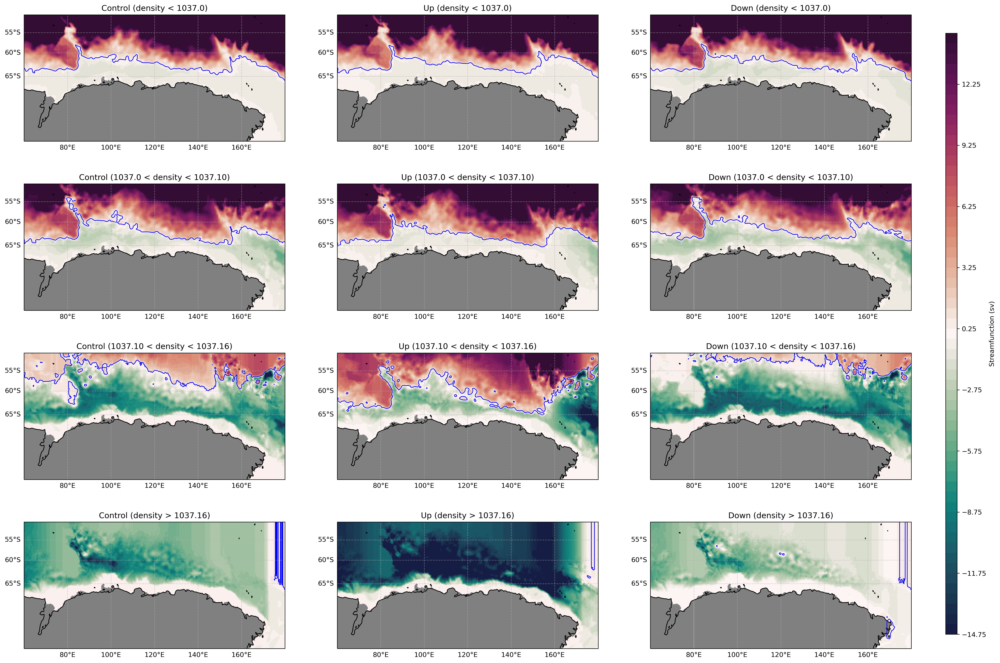

In [45]:
# plot the connection region
projection=ccrs.Mercator(min_latitude=-75.0, max_latitude=-50.0)
fig = plt.figure(figsize=(24, 18), dpi=300)
# rho1
ax = plt.subplot(4, 3, 1, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_con1.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_con1.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Control (density < 1037.0)')
ax. grid(False)

ax = plt.subplot(4, 3, 2, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_up1.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_up1.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Up (density < 1037.0)')
ax. grid(False)

ax = plt.subplot(4, 3, 3, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_down1.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_down1.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Down (density < 1037.0)')
ax. grid(False)

#rho2
ax = plt.subplot(4, 3, 4, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_con2.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_con2.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Control (1037.0 < density < 1037.10)')
ax. grid(False)

ax = plt.subplot(4, 3, 5, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_up2.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_up2.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Up (1037.0 < density < 1037.10)')
ax. grid(False)

ax = plt.subplot(4, 3, 6, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_down2.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_down2.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Down (1037.0 < density < 1037.10)')
ax. grid(False)

#rho3
ax = plt.subplot(4, 3, 7, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_con3.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_con3.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Control (1037.10 < density < 1037.16)')
ax. grid(False)

ax = plt.subplot(4, 3, 8, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_up3.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_up3.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Up (1037.10 < density < 1037.16)')
ax. grid(False)

ax = plt.subplot(4, 3, 9, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_down3.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_down3.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Down (1037.10 < density < 1037.16)')
ax. grid(False)

#rho4
ax = plt.subplot(4, 3, 10, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_con4.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_con4.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Control (density > 1037.16)')
ax. grid(False)

ax = plt.subplot(4, 3, 11, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_up4.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_up4.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Up (density > 1037.16)')
ax. grid(False)

ax = plt.subplot(4, 3, 12, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_down4.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_down4.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Down (density > 1037.16)')
ax. grid(False)

# colorbar 
ax = plt.axes([0.93, 0.15, 0.01, 0.7])
cb = plt.colorbar(p1, cax=ax, orientation='vertical',extend = 'none')
cb.ax.set_ylabel('Streamfunction (sv)')

In [46]:
# calculate the anomalies
# up case
ano_up1 = (flux_up1 - flux_con1).where(flux_con1 <0).load()
ano_up2 = (flux_up2 - flux_con2).where(flux_con2 <0).load()
ano_up3 = (flux_up3 - flux_con3).where(flux_con3 <0).load()
ano_up4 = (flux_up4 - flux_con4).where(flux_con4 <0).load()
# down case
ano_down1 = (flux_down1 - flux_con1).where(flux_con1 <0).load()
ano_down2 = (flux_down2 - flux_con2).where(flux_con2 <0).load()
ano_down3 = (flux_down3 - flux_con3).where(flux_con3 <0).load()
ano_down4 = (flux_down4 - flux_con4).where(flux_con4 <0).load()

Text(0.5, 0, 'Streamfunction anomaly (sv)')

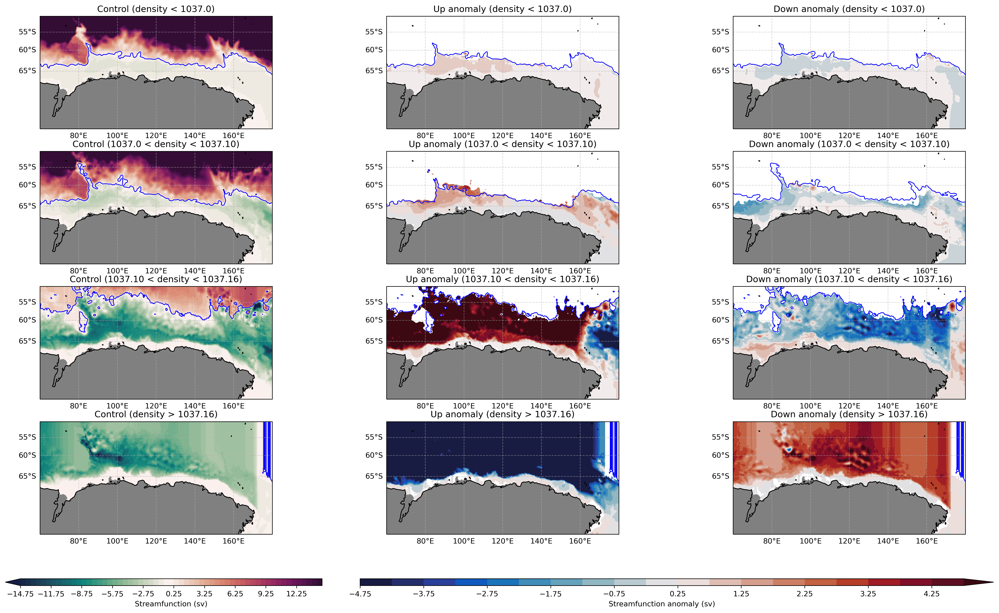

In [47]:
# plot the connection region
projection=ccrs.Mercator(min_latitude=-75.0, max_latitude=-50.0)
fig = plt.figure(figsize=(24, 13), dpi=300)
# rho1
ax = plt.subplot(4, 3, 1, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_con1.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_con1.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Control (density < 1037.0)')
ax. grid(False)

ax = plt.subplot(4, 3, 2, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_up1.plot.contourf(ax =ax, levels = np.arange(-4.75,5,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_con1.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Up anomaly (density < 1037.0)')
ax. grid(False)

ax = plt.subplot(4, 3, 3, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_down1.plot.contourf(ax =ax, levels = np.arange(-4.75,5,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_con1.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Down anomaly (density < 1037.0)')
ax. grid(False)

#rho2
ax = plt.subplot(4, 3, 4, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_con2.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_con2.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Control (1037.0 < density < 1037.10)')
ax. grid(False)

ax = plt.subplot(4, 3, 5, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_up2.plot.contourf(ax =ax, levels = np.arange(-4.75,5,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_up2.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Up anomaly (1037.0 < density < 1037.10)')
ax. grid(False)

ax = plt.subplot(4, 3, 6, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_down2.plot.contourf(ax =ax, levels = np.arange(-4.75,5,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_down2.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Down anomaly (1037.0 < density < 1037.10)')
ax. grid(False)

#rho3
ax = plt.subplot(4, 3, 7, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_con3.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_con3.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Control (1037.10 < density < 1037.16)')
ax. grid(False)

ax = plt.subplot(4, 3, 8, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_up3.plot.contourf(ax =ax, levels = np.arange(-4.75,5,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_con3.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Up anomaly (1037.10 < density < 1037.16)')
ax. grid(False)

ax = plt.subplot(4, 3, 9, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_down3.plot.contourf(ax =ax, levels = np.arange(-4.75,5,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_con3.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Down anomaly (1037.10 < density < 1037.16)')
ax. grid(False)

#rho4
ax = plt.subplot(4, 3, 10, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p1 = flux_con4.plot.contourf(ax =ax, levels = np.arange(-14.75,15,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.curl,add_colorbar=False)
flux_con4.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Control (density > 1037.16)')
ax. grid(False)

ax = plt.subplot(4, 3, 11, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_up4.plot.contourf(ax =ax, levels = np.arange(-4.75,5,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_con4.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Up anomaly (density > 1037.16)')
ax. grid(False)

ax = plt.subplot(4, 3, 12, projection=projection)
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
lb =ax.gridlines(draw_labels=True,linestyle='--',alpha=0.5)
lb.xlabels_top = False
lb.ylabels_right = False
lb.ylocator = mticker.FixedLocator([-65, -60,-55])
p2 = ano_down4.plot.contourf(ax =ax, levels = np.arange(-4.75,5,0.5), transform=ccrs.PlateCarree(),cmap=cm.cm.balance,add_colorbar=False)
flux_con4.plot.contour(ax=ax,levels=[0.5],linewidths = 1,colors=['b'],transform=ccrs.PlateCarree())
ax.contourf(depth.xh,depth.yh,land_mask,transform=ccrs.PlateCarree(),colors='grey')
ax.coastlines(resolution='50m')
ax.add_feature(cft.LAND)
ax.set_extent([60, 180, -75, -50], crs=ccrs.PlateCarree())
ax.set_title('Down anomaly (density > 1037.16)')
ax. grid(False)

# colorbar 
ax = plt.axes([0.12, 0.05, 0.25, 0.01])
cb = plt.colorbar(p1, cax=ax, orientation='horizontal',extend = 'both')
cb.ax.set_xlabel('Streamfunction (sv)')

ax = plt.axes([0.4, 0.05, 0.5, 0.01])
cb = plt.colorbar(p2, cax=ax, orientation='horizontal',extend = 'both')
cb.ax.set_xlabel('Streamfunction anomaly (sv)')

# Saddle points in different layers

# Transect of density layers


In [ ]:
session = cc.database.create_session(db)

In [ ]:
# load the perturbation hmo
hmo_down = cc.querying.getvar('wind-down-whole', 'hmo', session).sel(time = slice(start_time,end_time))
hmo_up = cc.querying.getvar('wind-up-whole', 'hmo', session).sel(time = slice(start_time,end_time))

In [ ]:
# laod control hmo
session = cc.database.create_session()
hmo_con = cc.querying.getvar(expt='panant-01-hycom1-v13', variable='hmo', 
                          session=session, frequency='1 monthly',
                          start_time='1991-01-31 00:00:00', 
                          end_time='2000-12-31 00:00:00').sel(time = slice(start_time,end_time))


In [ ]:
#select the connection region
#control
hmo_con1 = hmo_con.sel(xh = slice(-280,-180)).sel(yh = slice(-90,-50))
hmo_con2 = hmo_con.sel(xh = slice(60,80)).sel(yh = slice(-90,-50))
hmo_con = xr.concat([hmo_con2,hmo_con1],dim='xh')
# up
hmo_up1 = hmo_up.sel(xh = slice(-280,-180)).sel(yh = slice(-90,-50))
hmo_up2 = hmo_up.sel(xh = slice(60,80)).sel(yh = slice(-90,-50))
hmo_up = xr.concat([hmo_up2,hmo_up1],dim='xh')
# down
hmo_down1 = hmo_down.sel(xh = slice(-280,-180)).sel(yh = slice(-90,-50))
hmo_down2 = hmo_down.sel(xh = slice(60,80)).sel(yh = slice(-90,-50))
hmo_down = xr.concat([hmo_down2,hmo_down1],dim='xh')

In [ ]:
# hmo with new coordinates
hmo_con = xr.DataArray(hmo_con, dims = ['time','rho2_l','yh','xh'], coords = [flux_con.time,flux_con.rho2_l,flux_con.yh, x01])
hmo_down = xr.DataArray(hmo_down, dims = ['time','rho2_l','yh','xh'], coords = [flux_down.time,flux_down.rho2_l,flux_down.yh, x01])
hmo_up = xr.DataArray(hmo_up, dims = ['time','rho2_l','yh','xh'], coords = [flux_up.time,flux_up.rho2_l,flux_up.yh, x01])

In [ ]:
# calculate the layer thickness
# control
h1 = hmo_con.mean('time').sel(rho2_l=slice(0,rho1)).sum('rho2_l').load()
h2 = hmo_con.mean('time').sel(rho2_l=slice(rho1,rho2)).sum('rho2_l').load()
h3 = hmo_con.mean('time').sel(rho2_l=slice(rho2,rho5)).sum('rho2_l').load()
h4 = hmo_con.mean('time').sel(rho2_l=slice(rho5,1038.)).sum('rho2_l').load()

In [ ]:
# up case
h1_up = hmo_up.mean('time').sel(rho2_l=slice(0,rho1)).sum('rho2_l').load()
h2_up = hmo_up.mean('time').sel(rho2_l=slice(rho1,rho2)).sum('rho2_l').load()
h3_up = hmo_up.mean('time').sel(rho2_l=slice(rho2,rho5)).sum('rho2_l').load()
h4_up = hmo_up.mean('time').sel(rho2_l=slice(rho5,1038.)).sum('rho2_l').load()

In [ ]:
# down case
h1_down = hmo_down.mean('time').sel(rho2_l=slice(0,rho1)).sum('rho2_l').load()
h2_down = hmo_down.mean('time').sel(rho2_l=slice(rho1,rho2)).sum('rho2_l').load()
h3_down = hmo_down.mean('time').sel(rho2_l=slice(rho2,rho5)).sum('rho2_l').load()
h4_down = hmo_down.mean('time').sel(rho2_l=slice(rho5,1038.)).sum('rho2_l').load()

In [ ]:
# compute the transects
x1=90
# control
depth1_con = np.stack([0.0*h1.sel(xh=x1,method='nearest').values,
                   h1.sel(xh=x1,method='nearest').values,
                   (h1+h2).sel(xh=x1,method='nearest').values,
                   (h1+h2+h3).sel(xh=x1,method='nearest').values,
                   (h1+h2+h3+h4).sel(xh=x1,method='nearest').values])
fluxes1_con = np.stack([flux_con1.sel(xq=x1,method='nearest').values,
                   flux_con2.sel(xq=x1,method='nearest').values,
                    flux_con3.sel(xq=x1,method='nearest').values,
                    flux_con4.sel(xq=x1,method='nearest').values])
# up
depth1_up = np.stack([0.0*h1_up.sel(xh=x1,method='nearest').values,
                   h1_up.sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up).sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up+h3_up).sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up+h3_up+h4_up).sel(xh=x1,method='nearest').values])
fluxes1_up = np.stack([flux_up1.sel(xq=x1,method='nearest').values,
                   flux_up2.sel(xq=x1,method='nearest').values,
                    flux_up3.sel(xq=x1,method='nearest').values,
                    flux_up4.sel(xq=x1,method='nearest').values])
# down
depth1_down = np.stack([0.0*h1_down.sel(xh=x1,method='nearest').values,
                   h1_down.sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down).sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down+h3_down).sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down+h3_down+h4_down).sel(xh=x1,method='nearest').values])
fluxes1_down = np.stack([flux_down1.sel(xq=x1,method='nearest').values,
                   flux_down2.sel(xq=x1,method='nearest').values,
                    flux_down3.sel(xq=x1,method='nearest').values,
                    flux_down4.sel(xq=x1,method='nearest').values])

In [ ]:
# set the line color
c = ['k','r','b','m','k']

In [ ]:
#MOM6
# plot the outputs
plt.figure(figsize=(6,12),dpi = 300)

# 90E
plt.subplot(3,1,1)
plt.plot(flux_con1.yh.values,depth1_con[1,:],color = c[1],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[2,:],color = c[2],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[3,:],color = c[3],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[4,:],color = c[4],linewidth = 1)
plt.legend(['1037.0','1037.10','1037.16'], loc = 'lower left',fontsize =8)
p1 = plt.pcolor(flux_con1.yh.values,depth1_con,fluxes1_con[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Control at x = 90° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)

plt.subplot(3,1,2)
p1 = plt.pcolor(flux_up1.yh.values,depth1_up,fluxes1_up[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
for ii in range(5):
    contours=plt.plot(flux_con1.yh.values,depth1_up[ii,:],color = c[ii],linewidth = 1)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Up case at x = 90° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)

plt.subplot(3,1,3)
p1 = plt.pcolor(flux_down1.yh.values,depth1_down,fluxes1_down[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
for ii in range(5):
    contours=plt.plot(flux_con1.yh.values,depth1_down[ii,:],color = c[ii],linewidth = 1)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Down case at x = 90° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)
plt.ylabel('Latitude (°N)', fontsize = 15)

# colorbar 
ax = plt.axes([0.12, 0.07, 0.75, 0.01])
cb = plt.colorbar(p1, cax=ax, orientation='horizontal',extend = 'both')
cb.ax.set_xlabel('Streamfunction (sv)')

In [ ]:
# compute the transects
x1=140
# control
depth1_con = np.stack([0.0*h1.sel(xh=x1,method='nearest').values,
                   h1.sel(xh=x1,method='nearest').values,
                   (h1+h2).sel(xh=x1,method='nearest').values,
                   (h1+h2+h3).sel(xh=x1,method='nearest').values,
                   (h1+h2+h3+h4).sel(xh=x1,method='nearest').values])
fluxes1_con = np.stack([flux_con1.sel(xq=x1,method='nearest').values,
                   flux_con2.sel(xq=x1,method='nearest').values,
                    flux_con3.sel(xq=x1,method='nearest').values,
                    flux_con4.sel(xq=x1,method='nearest').values])
# up
depth1_up = np.stack([0.0*h1_up.sel(xh=x1,method='nearest').values,
                   h1_up.sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up).sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up+h3_up).sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up+h3_up+h4_up).sel(xh=x1,method='nearest').values])
fluxes1_up = np.stack([flux_up1.sel(xq=x1,method='nearest').values,
                   flux_up2.sel(xq=x1,method='nearest').values,
                    flux_up3.sel(xq=x1,method='nearest').values,
                    flux_up4.sel(xq=x1,method='nearest').values])
# down
depth1_down = np.stack([0.0*h1_down.sel(xh=x1,method='nearest').values,
                   h1_down.sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down).sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down+h3_down).sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down+h3_down+h4_down).sel(xh=x1,method='nearest').values])
fluxes1_down = np.stack([flux_down1.sel(xq=x1,method='nearest').values,
                   flux_down2.sel(xq=x1,method='nearest').values,
                    flux_down3.sel(xq=x1,method='nearest').values,
                    flux_down4.sel(xq=x1,method='nearest').values])

In [ ]:
#MOM6
# plot the outputs
plt.figure(figsize=(6,12),dpi = 300)

# 90E
plt.subplot(3,1,1)
plt.plot(flux_con1.yh.values,depth1_con[1,:],color = c[1],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[2,:],color = c[2],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[3,:],color = c[3],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[4,:],color = c[4],linewidth = 1)
plt.legend(['1037.0','1037.10','1037.16'], loc = 'lower left',fontsize =8)
p1 = plt.pcolor(flux_con1.yh.values,depth1_con,fluxes1_con[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Control at x = 140° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)

plt.subplot(3,1,2)
p1 = plt.pcolor(flux_up1.yh.values,depth1_up,fluxes1_up[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
for ii in range(5):
    contours=plt.plot(flux_con1.yh.values,depth1_up[ii,:],color = c[ii],linewidth = 1)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Up case at x = 140° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)

plt.subplot(3,1,3)
p1 = plt.pcolor(flux_down1.yh.values,depth1_down,fluxes1_down[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
for ii in range(5):
    contours=plt.plot(flux_con1.yh.values,depth1_down[ii,:],color = c[ii],linewidth = 1)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Down case at x = 140° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)
plt.ylabel('Latitude (°N)', fontsize = 15)

# colorbar 
ax = plt.axes([0.12, 0.07, 0.75, 0.01])
cb = plt.colorbar(p1, cax=ax, orientation='horizontal',extend = 'both')
cb.ax.set_xlabel('Streamfunction (sv)')

In [ ]:
# compute the transects
x1=170
# control
depth1_con = np.stack([0.0*h1.sel(xh=x1,method='nearest').values,
                   h1.sel(xh=x1,method='nearest').values,
                   (h1+h2).sel(xh=x1,method='nearest').values,
                   (h1+h2+h3).sel(xh=x1,method='nearest').values,
                   (h1+h2+h3+h4).sel(xh=x1,method='nearest').values])
fluxes1_con = np.stack([flux_con1.sel(xq=x1,method='nearest').values,
                   flux_con2.sel(xq=x1,method='nearest').values,
                    flux_con3.sel(xq=x1,method='nearest').values,
                    flux_con4.sel(xq=x1,method='nearest').values])
# up
depth1_up = np.stack([0.0*h1_up.sel(xh=x1,method='nearest').values,
                   h1_up.sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up).sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up+h3_up).sel(xh=x1,method='nearest').values,
                   (h1_up+h2_up+h3_up+h4_up).sel(xh=x1,method='nearest').values])
fluxes1_up = np.stack([flux_up1.sel(xq=x1,method='nearest').values,
                   flux_up2.sel(xq=x1,method='nearest').values,
                    flux_up3.sel(xq=x1,method='nearest').values,
                    flux_up4.sel(xq=x1,method='nearest').values])
# down
depth1_down = np.stack([0.0*h1_down.sel(xh=x1,method='nearest').values,
                   h1_down.sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down).sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down+h3_down).sel(xh=x1,method='nearest').values,
                   (h1_down+h2_down+h3_down+h4_down).sel(xh=x1,method='nearest').values])
fluxes1_down = np.stack([flux_down1.sel(xq=x1,method='nearest').values,
                   flux_down2.sel(xq=x1,method='nearest').values,
                    flux_down3.sel(xq=x1,method='nearest').values,
                    flux_down4.sel(xq=x1,method='nearest').values])

In [ ]:
#MOM6
# plot the outputs
plt.figure(figsize=(6,12),dpi = 300)

# 90E
plt.subplot(3,1,1)
plt.plot(flux_con1.yh.values,depth1_con[1,:],color = c[1],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[2,:],color = c[2],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[3,:],color = c[3],linewidth = 1)
plt.plot(flux_con1.yh.values,depth1_con[4,:],color = c[4],linewidth = 1)
plt.legend(['1037.0','1037.10','1037.16'], loc = 'lower left',fontsize =8)
p1 = plt.pcolor(flux_con1.yh.values,depth1_con,fluxes1_con[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Control at x = 170° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)

plt.subplot(3,1,2)
p1 = plt.pcolor(flux_up1.yh.values,depth1_up,fluxes1_up[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
for ii in range(5):
    contours=plt.plot(flux_con1.yh.values,depth1_up[ii,:],color = c[ii],linewidth = 1)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Up case at x = 170° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)

plt.subplot(3,1,3)
p1 = plt.pcolor(flux_down1.yh.values,depth1_down,fluxes1_down[:,1:],shading='flat',vmin=-15,vmax=15,cmap=cm.cm.curl)
for ii in range(5):
    contours=plt.plot(flux_con1.yh.values,depth1_down[ii,:],color = c[ii],linewidth = 1)
plt.ylim(0,6000)
plt.gca().invert_yaxis()
plt.title('Down case at x = 170° E',fontsize = 14)
plt.xlim(-80,-50)
plt.ylabel('Depth (m)', fontsize = 15)
plt.ylabel('Latitude (°N)', fontsize = 15)

# colorbar 
ax = plt.axes([0.12, 0.07, 0.75, 0.01])
cb = plt.colorbar(p1, cax=ax, orientation='horizontal',extend = 'both')
cb.ax.set_xlabel('Streamfunction (sv)')